# Interpretability methods: LIME and GradCAM 

In [1]:
## import all necessary modules
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import numpy as np
from keras.utils import np_utils
from imblearn.over_sampling import RandomOverSampler
from PIL import Image
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Conv2D, MaxPooling2D, Flatten
from keras import optimizers
from keras import losses
from tensorflow.keras.layers import AveragePooling2D
import cv2
from sklearn import metrics
import tensorflow as tf
from sklearn.metrics import confusion_matrix

from keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score
from sklearn.utils.class_weight import compute_class_weight
from keras.callbacks import EarlyStopping
from Interpretability import * 

import matplotlib.cm as cm
from keras.preprocessing import image
from skimage import img_as_ubyte
from skimage.transform import resize
import numpy as np
import matplotlib.pyplot as plt

import keras

import lime
import lime.lime_image
from lime import lime_image
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries

from lime.wrappers.scikit_image import SegmentationAlgorithm

import contextlib
import io
from matplotlib import patches
from matplotlib.colors import ListedColormap
import time
from mpl_toolkits.axes_grid1 import ImageGrid


## Load data and model 

In [4]:
## loading data
x_train = np.load("created_data/MIAS/patches/MIAS_X_train_roi_multi.npy")
x_train = np.load("created_data/MIAS/patches/MIAS_X_train_roi_multi.npy") / 255
y_train = np.load("created_data/MIAS/patches/MIAS_y_train_roi_multi.npy")
x_valid = np.load("created_data/MIAS/patches/MIAS_X_valid_roi_multi.npy") / 255
y_valid = np.load("created_data/MIAS/patches/MIAS_y_valid_roi_multi.npy") 
x_test = np.load("created_data/MIAS/patches/MIAS_X_test_roi_multi.npy") / 255
y_test = np.load("created_data/MIAS/patches/MIAS_y_test_roi_multi.npy") 

print(x_train.shape, x_valid.shape, x_test.shape)

## print counts per class of y_train
print(np.unique(y_train, return_counts = True))

# One-hot encode labels
num_classes = 3
y_train = np_utils.to_categorical(y_train, num_classes)
y_valid = np_utils.to_categorical(y_valid, num_classes)
y_test = np_utils.to_categorical(y_test, num_classes)

## load model 
model = keras.models.load_model('best_model.h5')
model.summary()

labels = np.argmax(y_test, axis=1) ## de-encode hot-encoded y_labels [1 0 0 ] -> 0

y_test.shape # get shape -> number of testing images

(1584, 224, 224, 3) (47, 224, 224, 3) (48, 224, 224, 3)
(array([0, 1, 2]), array([528, 528, 528], dtype=int64))
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 220, 220, 16)      1216      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 106, 106, 16)      6416      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 16)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 53, 53, 14)        2030      
        

(48, 3)

In [3]:
##48-12
# 40 38 36
print(np.unique(labels, return_counts = True))

(array([0, 1, 2], dtype=int64), array([31,  9,  8], dtype=int64))


##  plot Images 

In [4]:
## set font size for all plots
plt.rcParams['font.size'] = 12

In [ ]:
for idx, img in enumerate(x_test):
    plt.imshow(img)
    plt.show()
    print(idx)

## Get lime plot for all images

## Measuring time complexity and plot all LIME plots

In [ ]:
total = 0 # empty list to store time counts
plt.rcParams['font.size'] = 16
class_dict = {}


for idx, (img, lab) in enumerate(zip(x_test, labels)):
    # extracting the original image, mask, border, filled_mask and time of LIME for positive and negative predictions
    image, mask, border, filled_mask, time = plot_lime_explanation(idx, model, img, lab, positive_only = False, random_state = 44) # get the lime plot for all images, including neg. predictions
    total += time # add time
    # getting predicted label
    pred = np.argmax(model.predict(np.array([img]))) 
    
    # store images in a dictionary {pred_label: {border, filled_mask, mask, true_label}}
    try:
        class_dict[pred].append((border, filled_mask, mask,lab)) 
    except:
        class_dict[pred] = [(border, filled_mask, mask,lab)]
    
print(f"On Average, the LIME computations took {total/len(x_test)} seconds")

In [11]:
print(f"On Average, LIME took {total/len(x_test)} seconds to plot")

On Average, LIME took 50.454689299066864 seconds to plot


## Plotting all images per predicted class

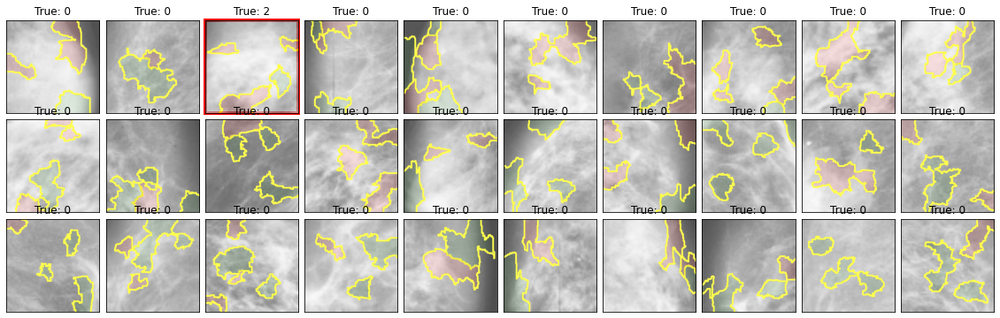

<Figure size 432x288 with 0 Axes>

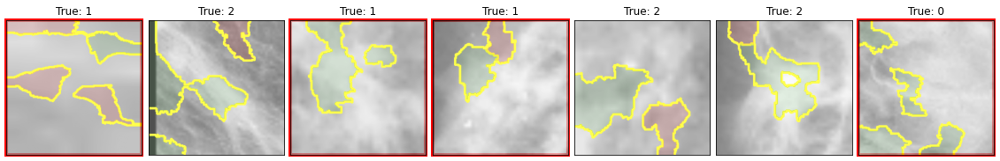

<Figure size 432x288 with 0 Axes>

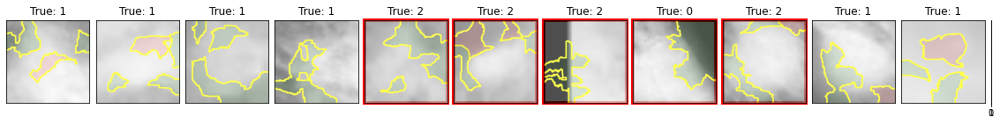

<Figure size 432x288 with 0 Axes>

In [14]:
## plotting all images per predicted class
colrow = [(3,10), (1,7), (1,12)]

for cr, (k, v) in zip(colrow, class_dict.items()): # loop over the predicted labels 
    label_names = ["Normal", "Benign", "Malignant"]
    ## k is the predicted label
    ## v is a list of tuples [(img, lab), (img, lab)] -> list of predicted instances of that class together with their true label 
    true_pred = list(filter(lambda x: x[3] == k, v)) # filter the correct labels 
    false_pred = list(filter(lambda x: x[3] != k, v)) # filter the incorrect cases
    
    fig = plt.figure(figsize=(20., 10.))
    
    # setting font size
    plt.rcParams['font.size'] = 10 

    #plt.suptitle('Predicted Class: {}'.format(label_names[k]), fontsize=12,y = -0.1)
    # creating an image grid
    grid = ImageGrid(fig, 111, 
                     nrows_ncols=cr,
                     axes_pad=0.1, 
                     )
    # looping over border, filled_mask, lab and plot an image grid pre prediction
    for i, ((border, filled_mask, mask, lab), is_true) in enumerate(zip(v, [lab==k for (_, _,_,lab) in v])):
        # yellow color for the border
        border_cmap = ListedColormap(['yellow'])
        # green colors if the mask does not contain negative predictions, else: use red and green to mark neg. and pos. predictions
        if list(np.unique(mask)) == [0, 1]:
            filled_cmap = ListedColormap(['green', 'white'])
        else:
            filled_cmap = ListedColormap(['red', 'green']) # red for negative predictions, green for positive
        
        ax = grid[i]
        ax.imshow(border, cmap = border_cmap, alpha = .7) # plot yellow border
        ax.imshow(filled_mask, alpha=0.1, cmap = filled_cmap) # plot filled mask
        ax.set_title('True: {}'.format(lab)) # , y = -0.12, alpha = 0.8
        # mark false predictions with a red border
        if not is_true: 
            ax.patch.set_edgecolor('red')
            ax.patch.set_linewidth(4)
        #ax.axis("off")
        # remove axis and x/y labels
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel('')
        ax.set_ylabel('')

    plt.show()
    plt.savefig(f"limeplots{label_names[k]}")

In [ ]:
## the same plot with different grid size

In [ ]:
## getting all images per class
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

colrow = [(5,6), (1,7), (2,6)]

for cr, (k, v) in zip(colrow, class_dict.items()): # loop over the predicted labels 
    label_names = ["Normal", "Benign", "Malignant"]
    #print(k) # the predicted label 
    #print(len(v)) ## v is a list of tuples [(img, lab), (img, lab)] -> list of predicted instances of that class together with their true label 
    true_pred = list(filter(lambda x: x[3] == k, v)) # filter the correct labels 
    false_pred = list(filter(lambda x: x[3] != k, v)) # filter the incorrect cases
    #print(len(true_pred), len(false_pred))
    
    fig = plt.figure(figsize=(20., 10.))
    plt.rcParams['font.size'] = 10

    #plt.suptitle('Predicted Class: {}'.format(label_names[k]), fontsize=12,y = -0.1)

    grid = ImageGrid(fig, 111, 
                     nrows_ncols=cr,
                     axes_pad=0.1, 
                     )

    for i, ((border, filled_mask, mask, lab), is_true) in enumerate(zip(v, [lab==k for (_, _,_,lab) in v])):
        border_cmap = ListedColormap(['yellow'])
        if list(np.unique(mask)) == [0, 1]:
            filled_cmap = ListedColormap(['green', 'white'])
        else:
            filled_cmap = ListedColormap(['red', 'green']) # red for negative predictions, green for positive
        
        ax = grid[i]
        ax.imshow(border, cmap = border_cmap, alpha = .7)
        ax.imshow(filled_mask, alpha=0.1, cmap = filled_cmap)
        ax.set_title('True: {}'.format(lab)) # , y = -0.12, alpha = 0.8
        if not is_true:
            #print(is_true)
           # ax.set_frame_on(True)
            ax.patch.set_edgecolor('red')
            ax.patch.set_linewidth(4)
        #ax.axis("off")
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel('')
        ax.set_ylabel('')

    plt.show()
    plt.savefig(f"limeplots{label_names[k]}")

## Test robustness of results by running the model 5 times

In [ ]:
## note the second next cell should be run first as it stores the images to the image_list

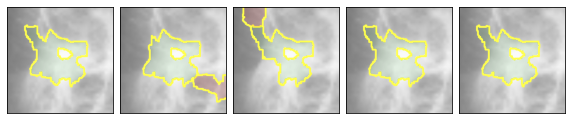

In [31]:
from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10, 10))
grid = ImageGrid(fig, 111, nrows_ncols=(1, 5), axes_pad=0.1)

# loop over border, filled_mask and mask of the lime predictions and plot all explanations next to each other
for i, (border, filled_mask, mask) in enumerate(image_list):
    # yellow border
    border_cmap = ListedColormap(['yellow'])
    # red and green heatmap for negative and positive predictions respectively
    if list(np.unique(mask)) == [0, 1]:
        filled_cmap = ListedColormap(['green', 'white'])
    else:
        filled_cmap = ListedColormap(['red', 'green']) # red for negative predictions, green for positive

    ax = grid[i]
    # plots the image with filled mask
    ax.imshow(border, cmap=border_cmap, alpha=0.7)
    ax.imshow(filled_mask, alpha=0.1, cmap=filled_cmap)
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 105ms/step


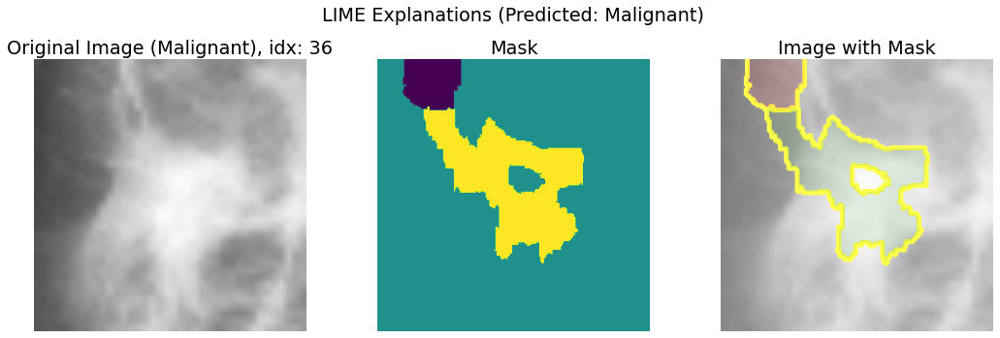

Time taken to compute LIME explanations: 44.59 seconds


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 63ms/step


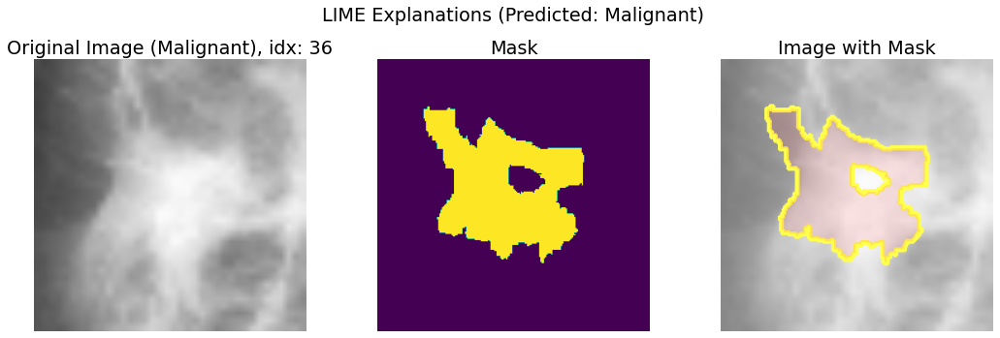

Time taken to compute LIME explanations: 37.62 seconds


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 73ms/step


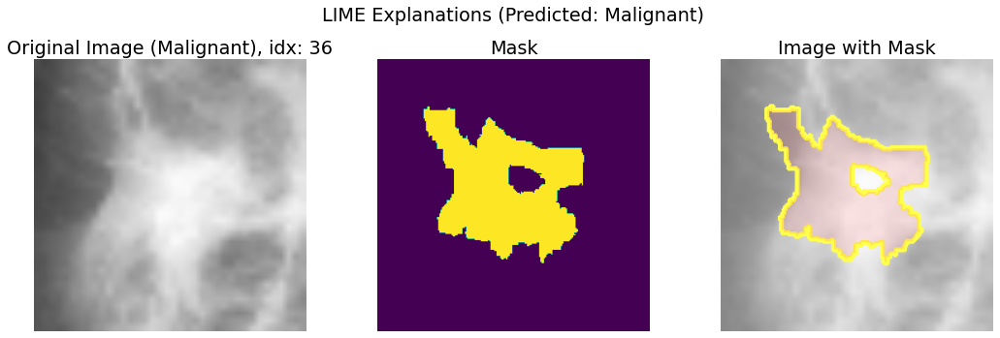

Time taken to compute LIME explanations: 56.15 seconds


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 179ms/step


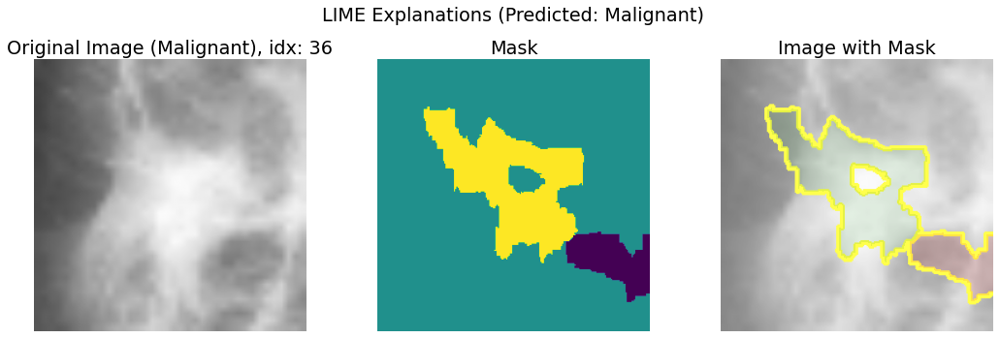

Time taken to compute LIME explanations: 40.49 seconds


In [7]:
## LIME without random_state
idx = 36
image_list = []
# loops over image five times and collects the predictions
for _ in range(5):
    image, mask, border, filled_mask, time = plot_lime_explanation(idx, model, x_test[idx], labels[idx], positive_only = False, random_state = None)
    image_list.append((border, filled_mask, mask))
    border_cmap = ListedColormap(['yellow'])
    if list(np.unique(mask)) == [0, 1]:
        filled_cmap = ListedColormap(['green', 'white'])
    else:
        filled_cmap = ListedColormap(['red', 'green']) # red for negative predictions, green for positive

    plt.imshow(border, cmap = border_cmap, alpha = .7)
    plt.imshow(filled_mask, alpha=0.1, cmap = filled_cmap)
    

## GRADCAM PLOT

In [8]:
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 220, 220, 16)      1216      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 106, 106, 16)      6416      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 16)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 53, 53, 14)        2030      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 14)      

## Getting explanations for first convolutional layer

In [ ]:
## since we dont have to evaluate the robustness of gradcam as explanations are deterministic, we will simply report the time complexity and graphs

In [ ]:
for i, l in zip(x_test, y_test):
    true = np.argmax(l) # true label
    pred = np.argmax(model.predict(np.array([i]))) # predicted label
    visualize_gradcam(i, model, "conv2d", true_label=true, pred_label=pred) # plot gradcam

## Getting explanations for second convolutional layer

In [ ]:
for i, l in zip(x_test, y_test):
    true = np.argmax(l) # true label
    pred = np.argmax(model.predict(np.array([i]))) # predicted label
    visualize_gradcam(i, model, "conv2d_1", true_label=true, pred_label=pred) # call gradcam on second conv layer

## Getting explanations for third convolutional layer  - what we are interested in 

In [ ]:
total = 0
for idx, (i, l) in enumerate(zip(x_test, y_test)):
    plt.rcParams['font.size'] = 16
    # extracting the true label 
    true = np.argmax(l)
    # extracting the predicted labrel 
    pred = np.argmax(model.predict(np.array([i])))
    # plot Grad-CAM of the third convolutional layer
    time, _, _, _ = visualize_gradcam(i, model, "conv2d_2", true_label=true, pred_label=pred, idx = idx)
    total += time

In [7]:
print(f"Producing the Grad-CAM activation took a total of {total/len(labels)} seconds")

Producing the Grad-CAM actiavtion took a total of 0.22962814072767893 seconds


## Creating dataframe of time complexity

In [20]:
import pandas as pd
# save all running times per algorithm
cols = ["LIME", "Grad-CAM", "SHAP-Kernel"]
data = [50.45,0.23,4.65]
avgtime_sec = pd.DataFrame(data = [data], columns=cols)
avgtime_sec.to_latex("avgtime_sec")


## Saving all images of Grad-CAM for different classes

1/1 [==============================] - 1s 604ms/step


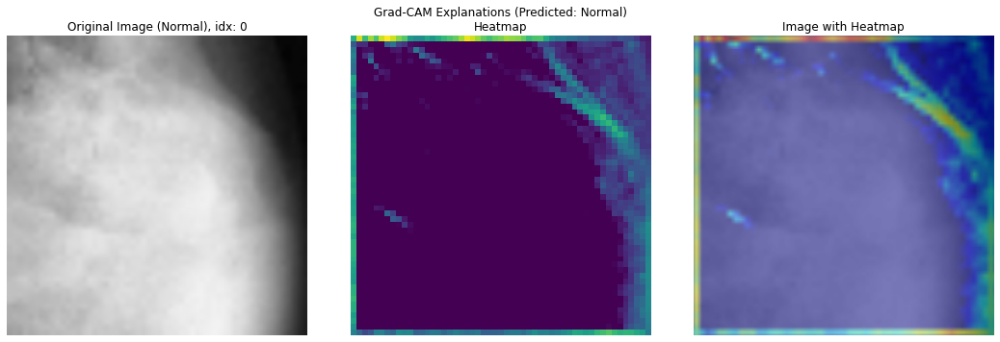

Time to compute Grad-CAM explanations: 0.4018 seconds
1/1 [==============================] - 0s 76ms/step


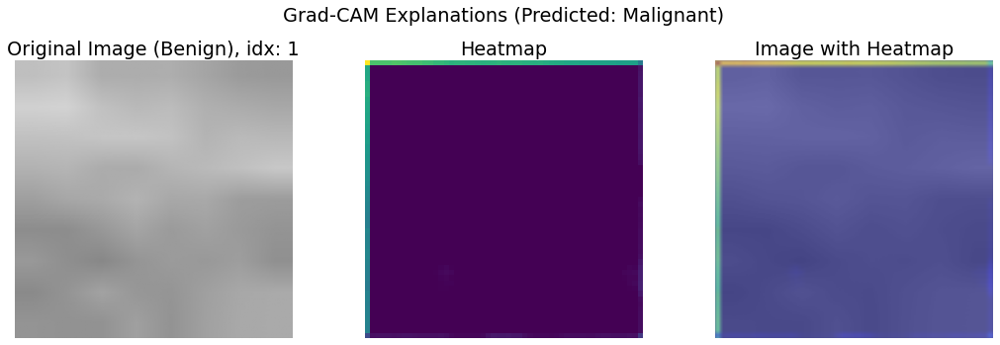

Time to compute Grad-CAM explanations: 0.2121 seconds
1/1 [==============================] - 0s 78ms/step


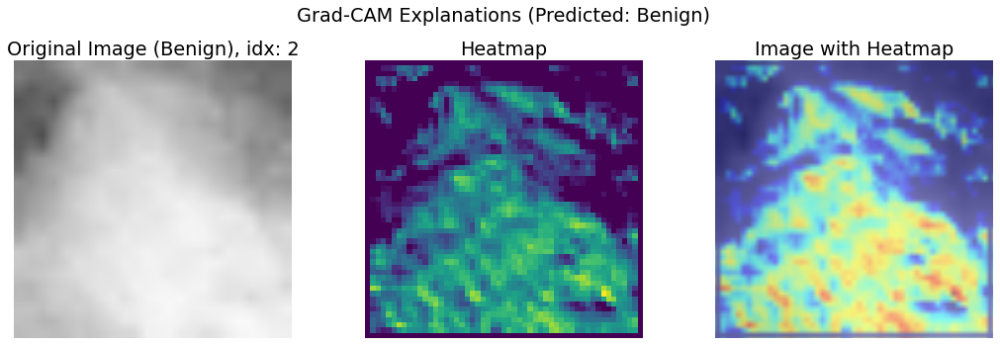

Time to compute Grad-CAM explanations: 0.2286 seconds
1/1 [==============================] - 0s 80ms/step


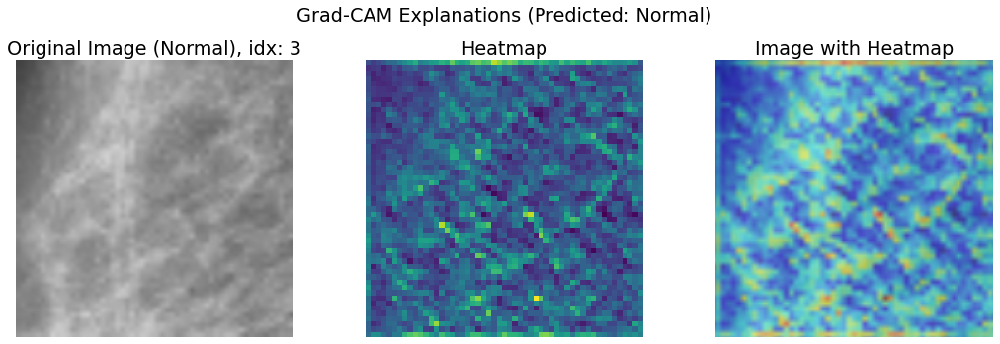

Time to compute Grad-CAM explanations: 0.2132 seconds
1/1 [==============================] - 0s 74ms/step


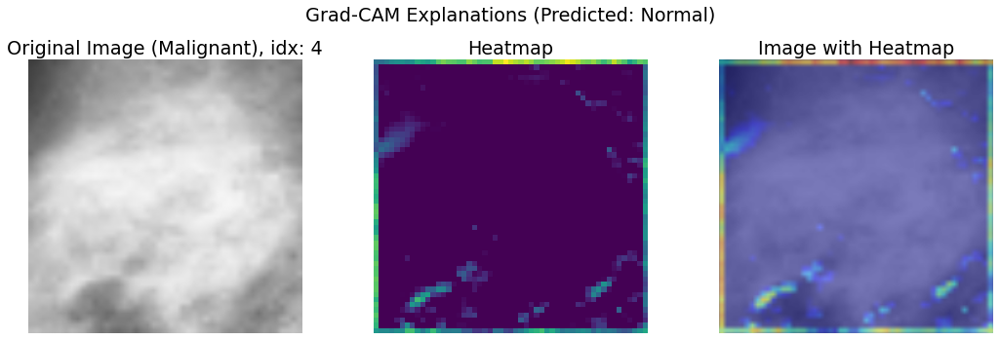

Time to compute Grad-CAM explanations: 0.1869 seconds
1/1 [==============================] - 0s 54ms/step


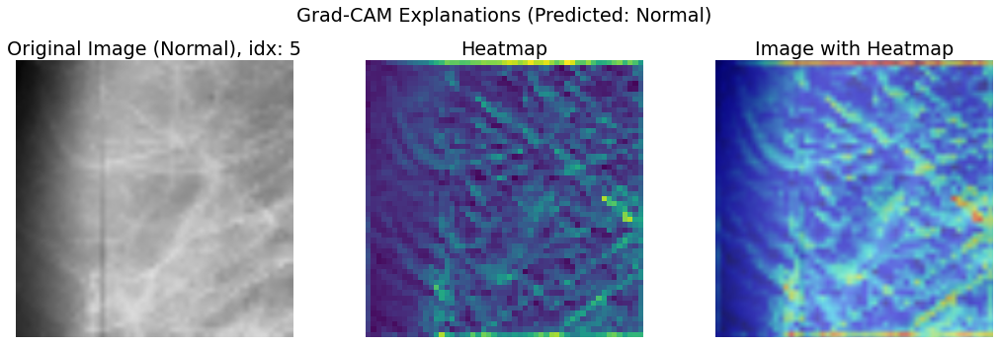

Time to compute Grad-CAM explanations: 0.1835 seconds
1/1 [==============================] - 0s 74ms/step


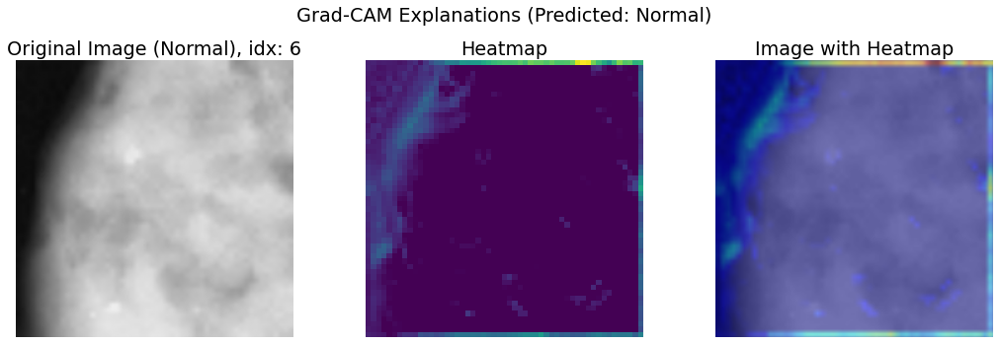

Time to compute Grad-CAM explanations: 0.1804 seconds
1/1 [==============================] - 0s 79ms/step


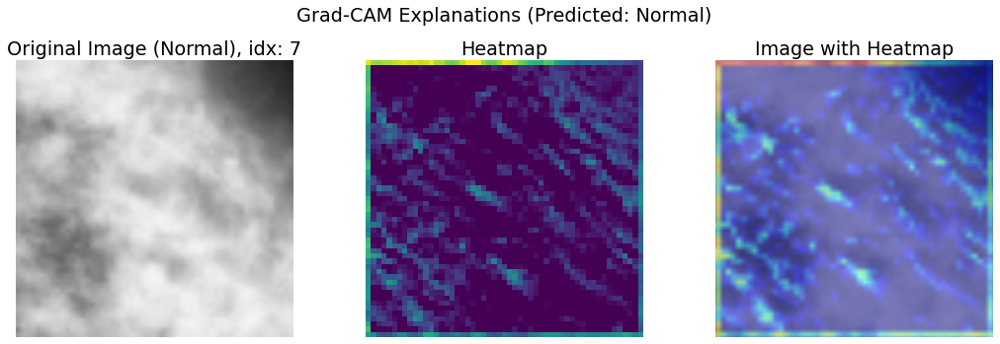

Time to compute Grad-CAM explanations: 0.1790 seconds
1/1 [==============================] - 0s 77ms/step


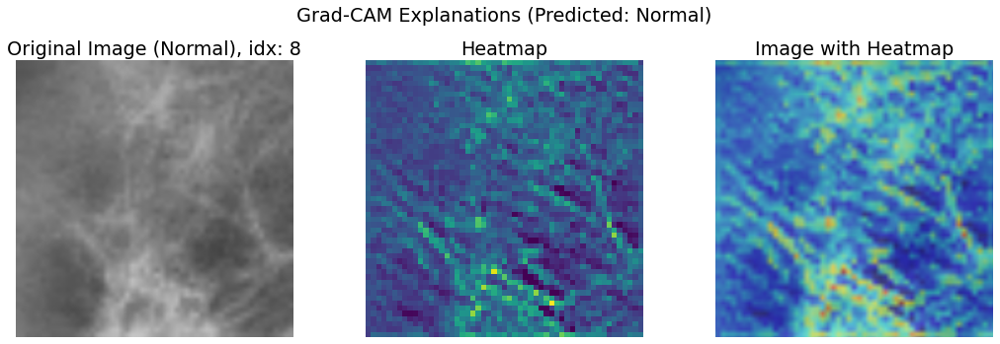

Time to compute Grad-CAM explanations: 0.1843 seconds
1/1 [==============================] - 0s 77ms/step


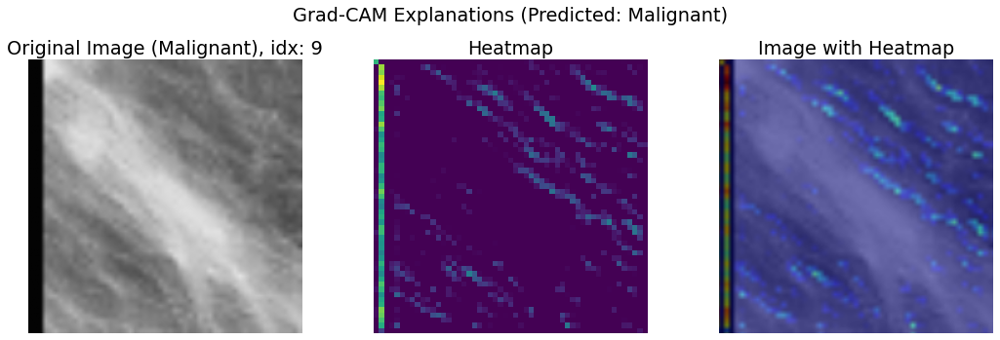

Time to compute Grad-CAM explanations: 0.1884 seconds
1/1 [==============================] - 0s 78ms/step


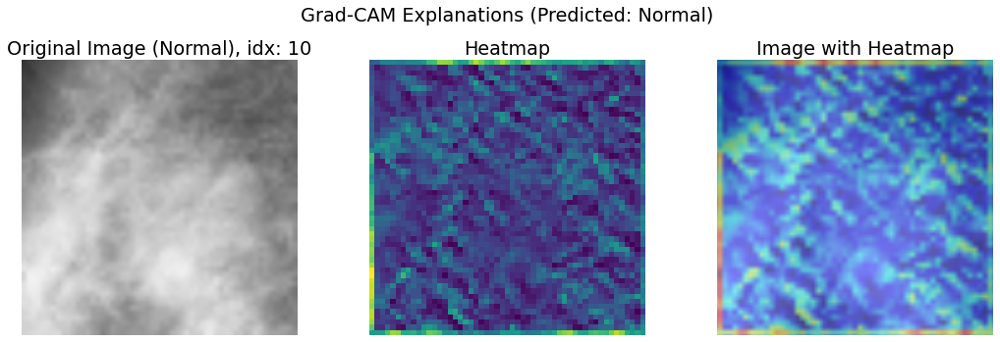

Time to compute Grad-CAM explanations: 0.1956 seconds
1/1 [==============================] - 0s 77ms/step


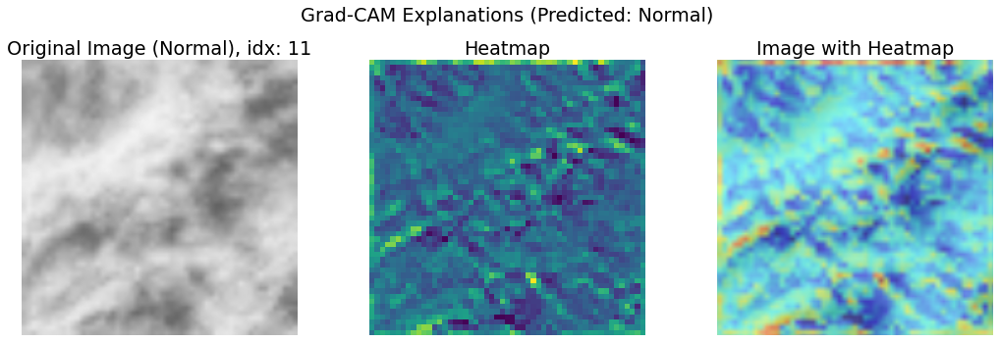

Time to compute Grad-CAM explanations: 0.1829 seconds
1/1 [==============================] - 0s 78ms/step


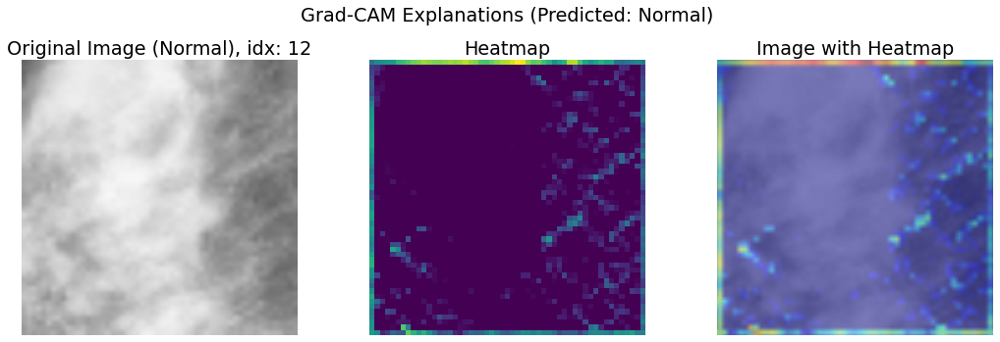

Time to compute Grad-CAM explanations: 0.1823 seconds
1/1 [==============================] - 0s 76ms/step


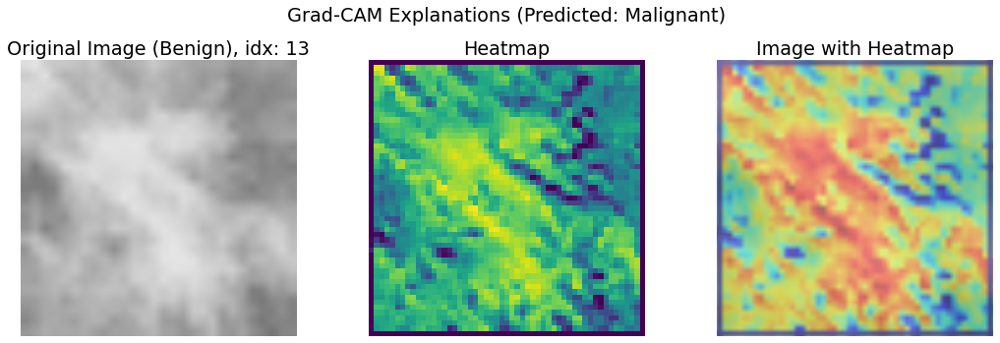

Time to compute Grad-CAM explanations: 0.1795 seconds
1/1 [==============================] - 0s 78ms/step


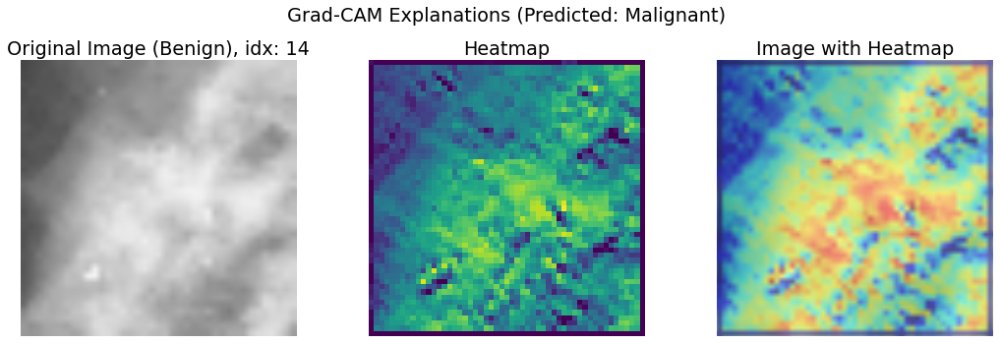

Time to compute Grad-CAM explanations: 0.1982 seconds
1/1 [==============================] - 0s 72ms/step


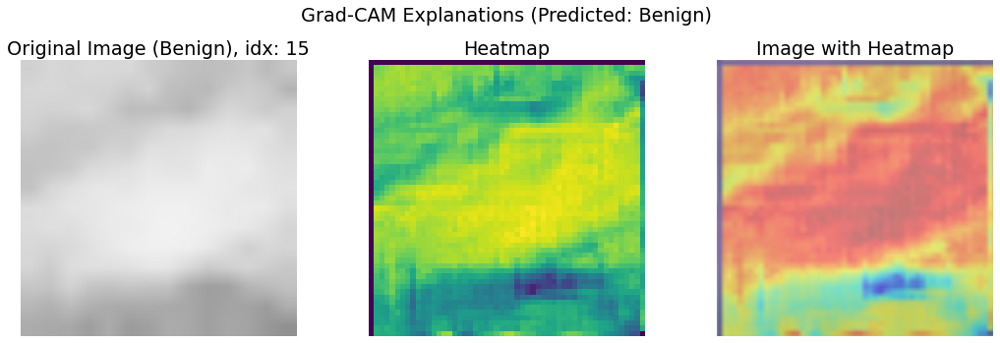

Time to compute Grad-CAM explanations: 0.2255 seconds
1/1 [==============================] - 0s 67ms/step


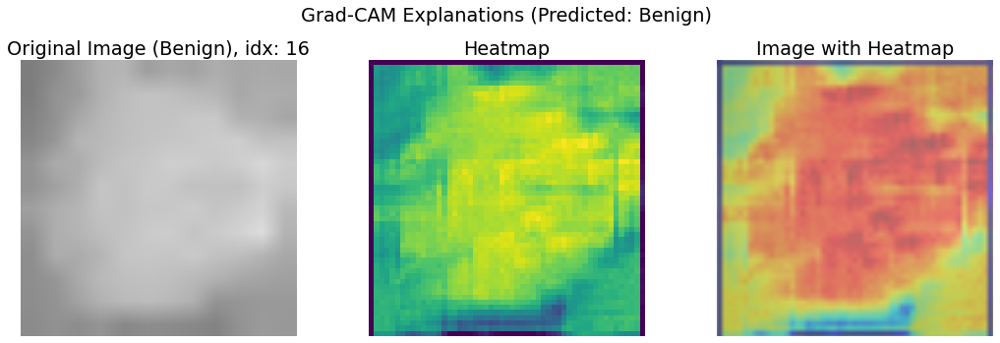

Time to compute Grad-CAM explanations: 0.1906 seconds
1/1 [==============================] - 0s 59ms/step


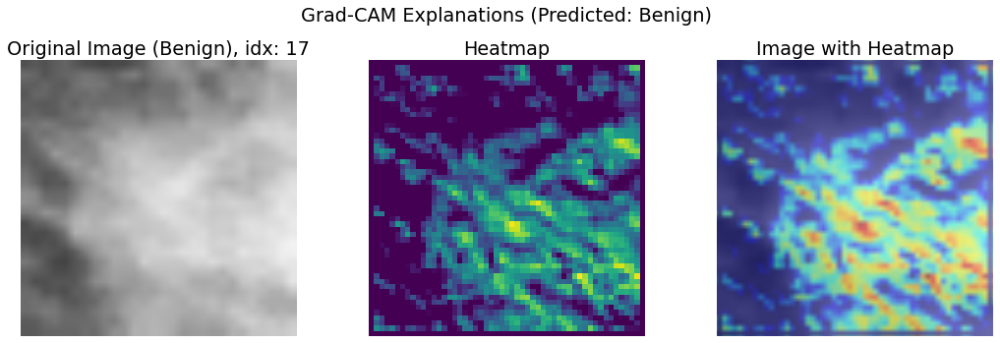

Time to compute Grad-CAM explanations: 0.1869 seconds
1/1 [==============================] - 0s 76ms/step


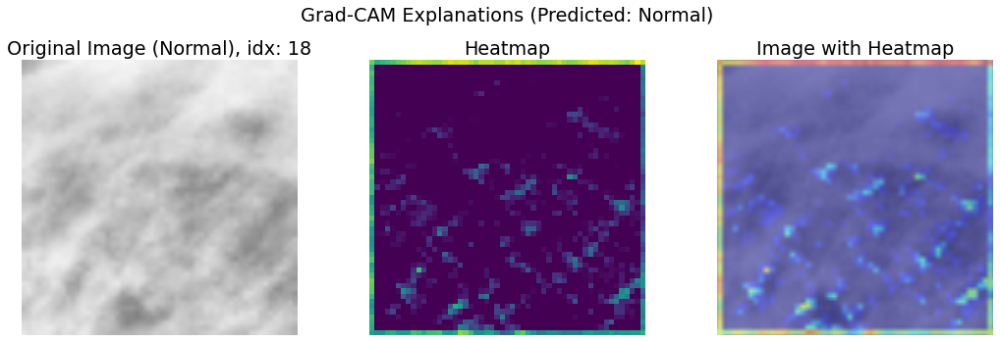

Time to compute Grad-CAM explanations: 0.2010 seconds
1/1 [==============================] - 0s 80ms/step


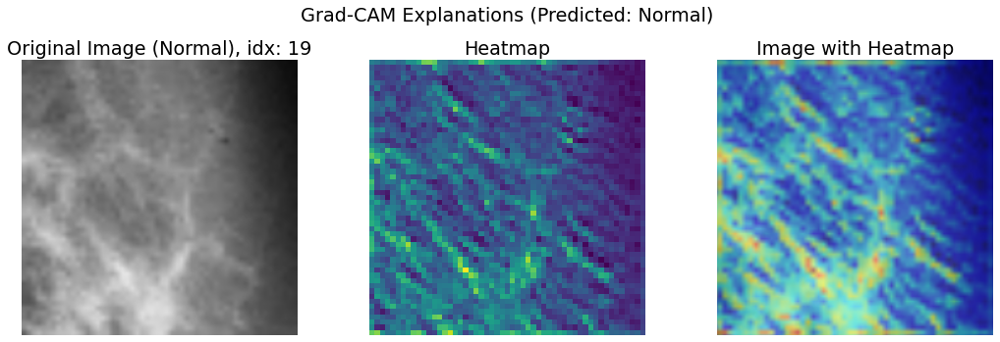

Time to compute Grad-CAM explanations: 0.1903 seconds
1/1 [==============================] - 0s 71ms/step


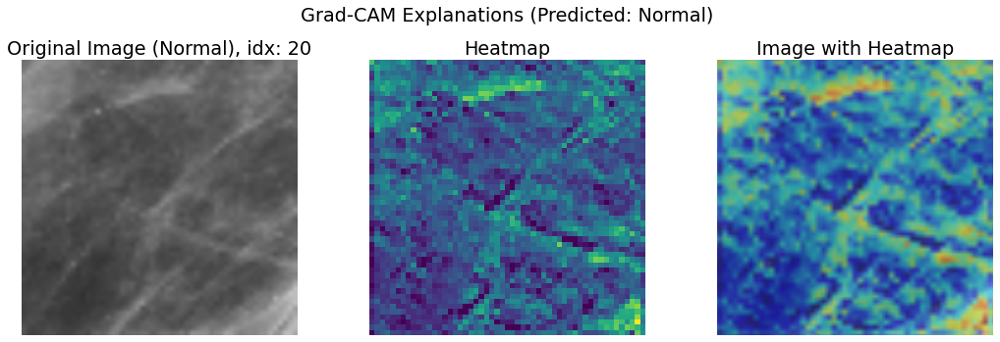

Time to compute Grad-CAM explanations: 0.2004 seconds
1/1 [==============================] - 0s 74ms/step


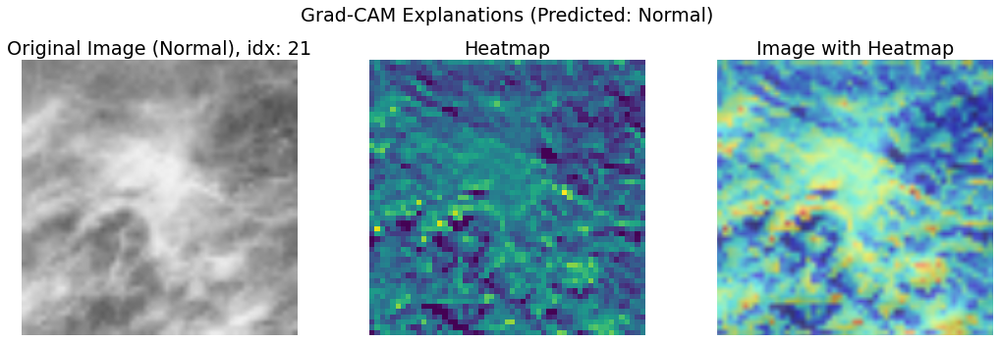

Time to compute Grad-CAM explanations: 0.1885 seconds
1/1 [==============================] - 0s 73ms/step


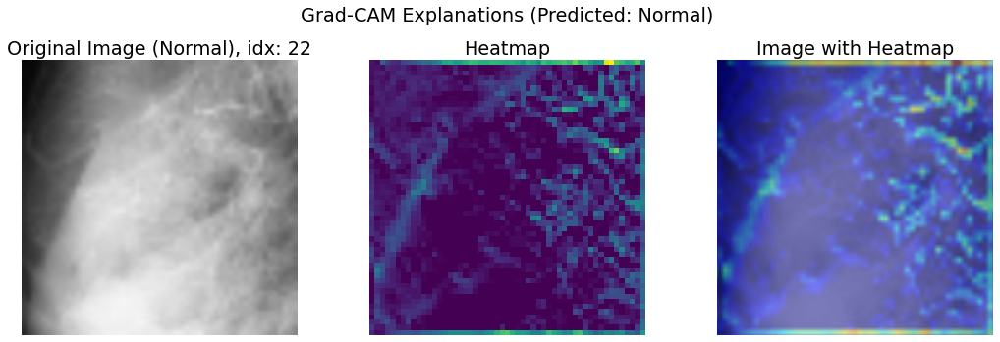

Time to compute Grad-CAM explanations: 0.1866 seconds
1/1 [==============================] - 0s 76ms/step


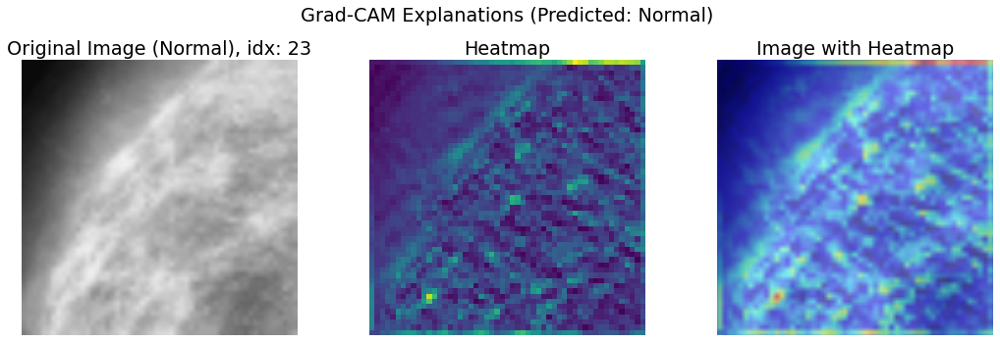

Time to compute Grad-CAM explanations: 0.1855 seconds
1/1 [==============================] - 0s 77ms/step


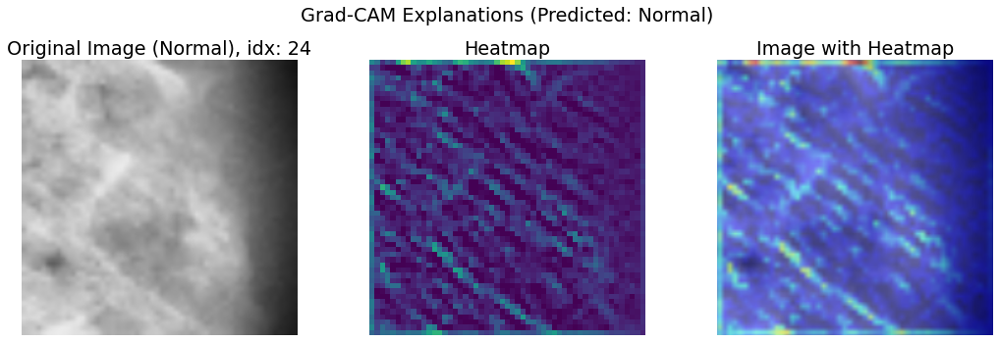

Time to compute Grad-CAM explanations: 0.2182 seconds
1/1 [==============================] - 0s 80ms/step


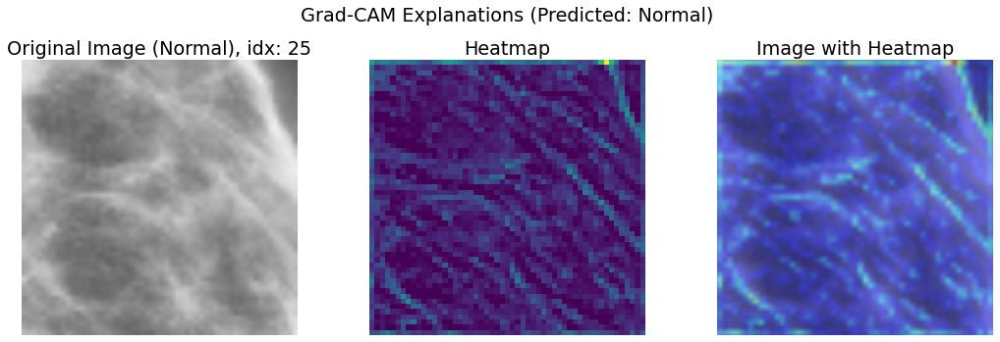

Time to compute Grad-CAM explanations: 0.1787 seconds
1/1 [==============================] - 0s 74ms/step


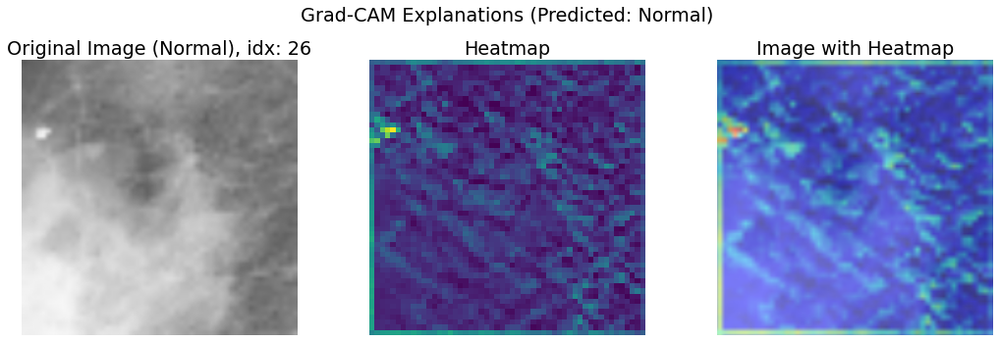

Time to compute Grad-CAM explanations: 0.1843 seconds
1/1 [==============================] - 0s 80ms/step


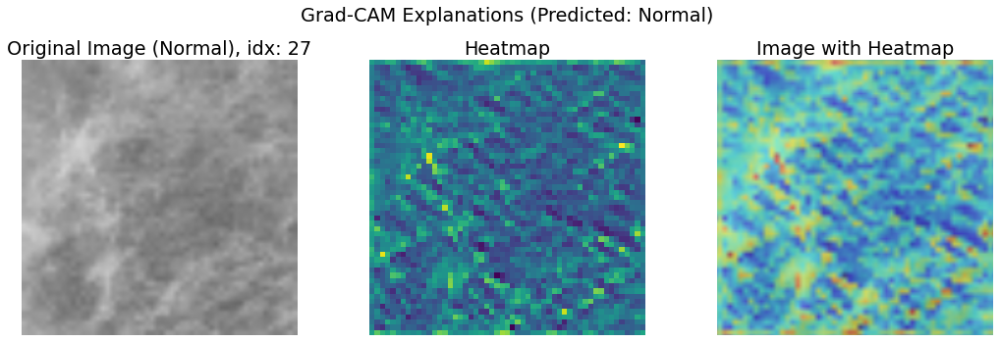

Time to compute Grad-CAM explanations: 0.1869 seconds
1/1 [==============================] - 0s 73ms/step


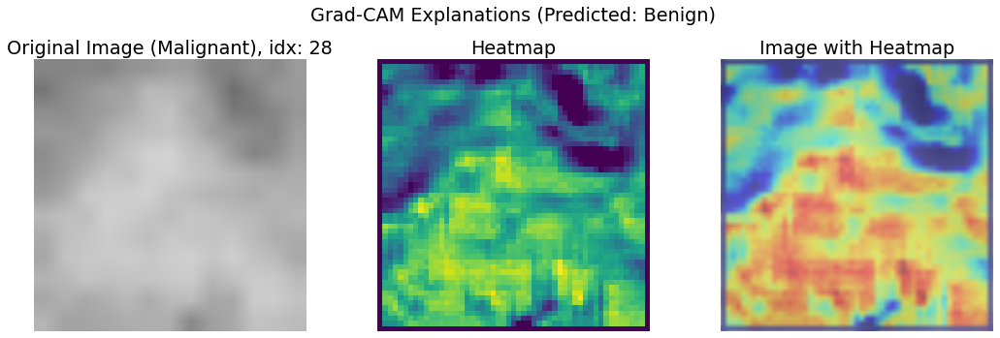

Time to compute Grad-CAM explanations: 0.1878 seconds
1/1 [==============================] - 0s 82ms/step


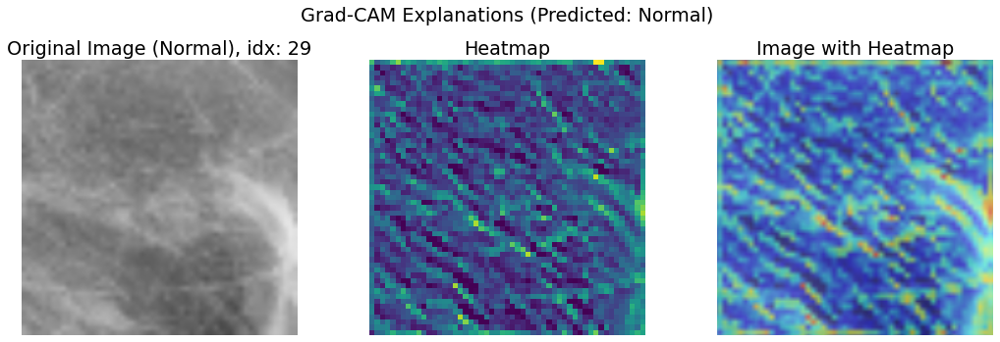

Time to compute Grad-CAM explanations: 0.1835 seconds
1/1 [==============================] - 0s 91ms/step


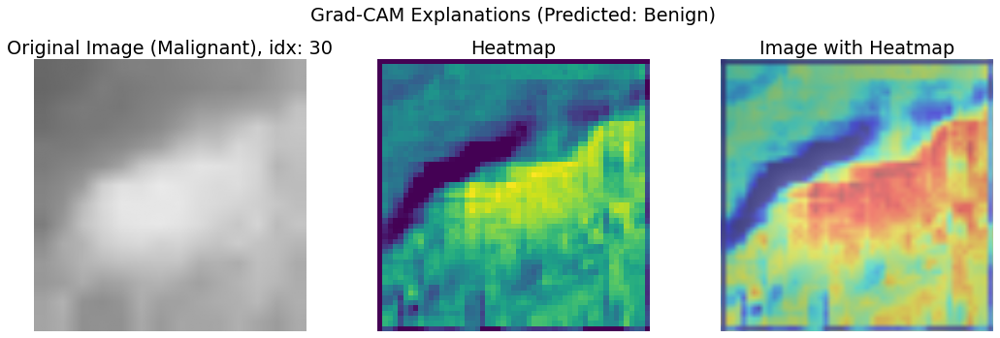

Time to compute Grad-CAM explanations: 0.2169 seconds
1/1 [==============================] - 0s 76ms/step


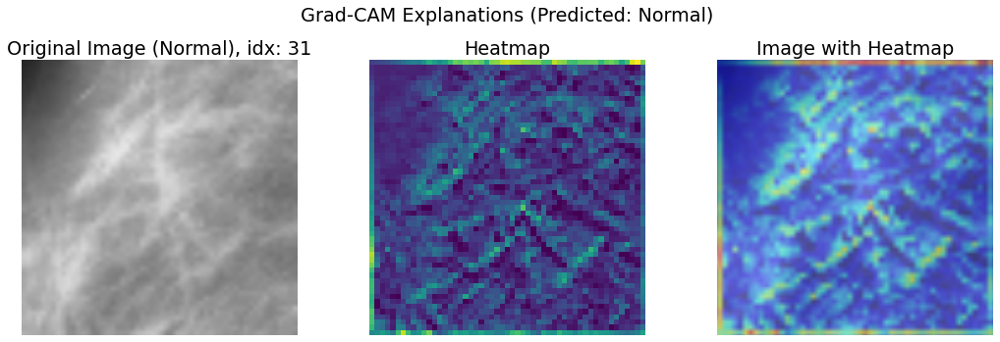

Time to compute Grad-CAM explanations: 0.1961 seconds
1/1 [==============================] - 0s 76ms/step


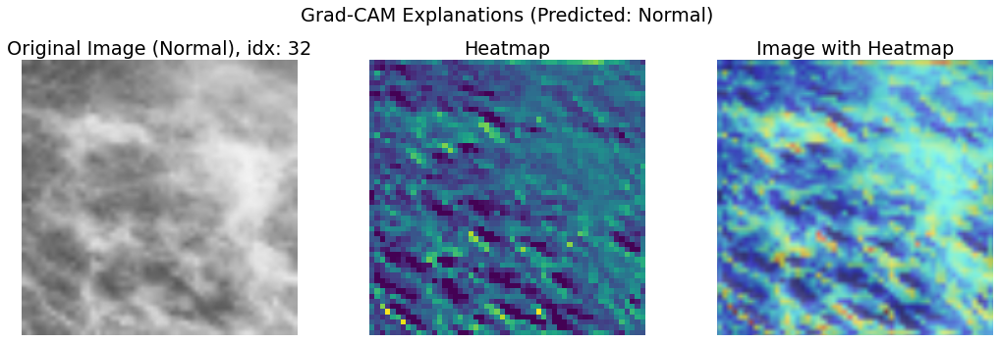

Time to compute Grad-CAM explanations: 0.1893 seconds
1/1 [==============================] - 0s 83ms/step


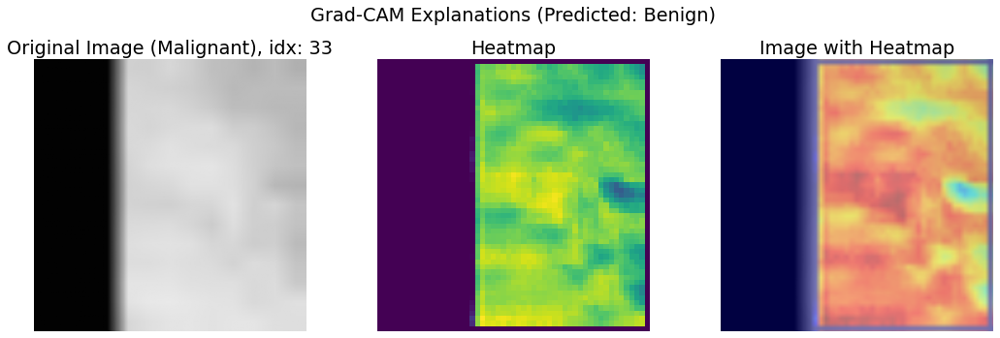

Time to compute Grad-CAM explanations: 0.1914 seconds
1/1 [==============================] - 0s 81ms/step


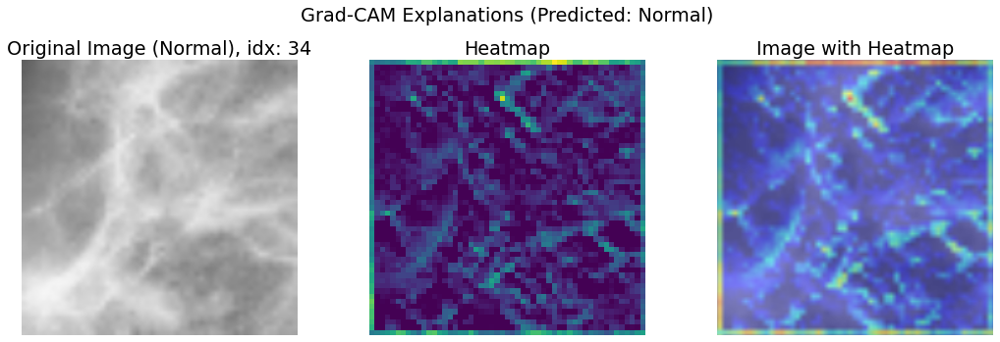

Time to compute Grad-CAM explanations: 0.1886 seconds
1/1 [==============================] - 0s 78ms/step


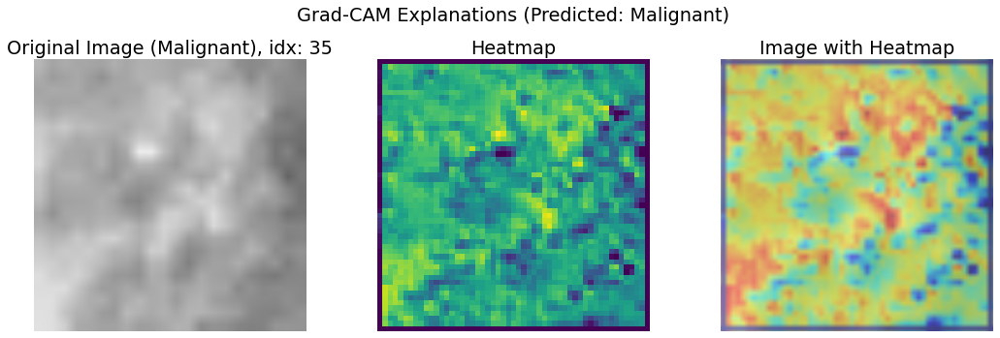

Time to compute Grad-CAM explanations: 0.1958 seconds
1/1 [==============================] - 0s 70ms/step


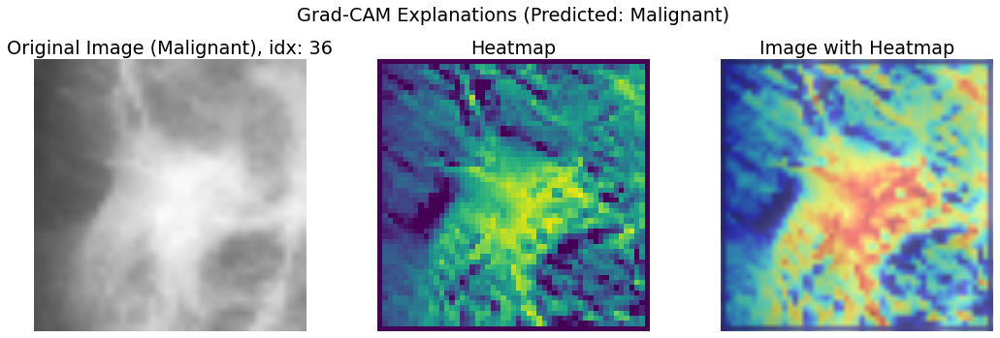

Time to compute Grad-CAM explanations: 0.1950 seconds
1/1 [==============================] - 0s 71ms/step


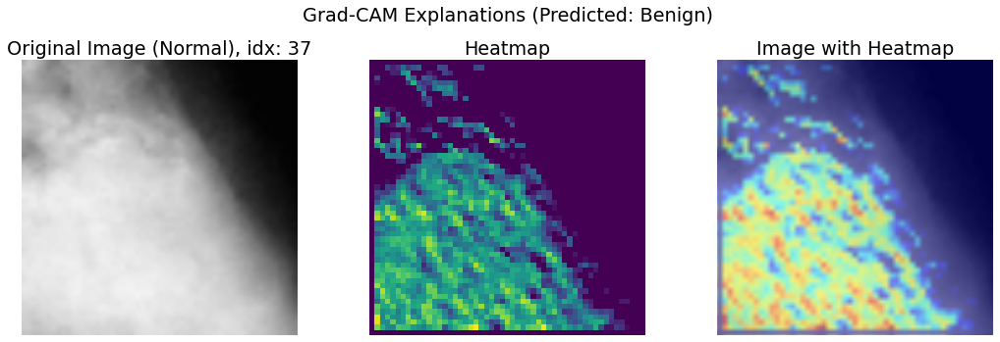

Time to compute Grad-CAM explanations: 0.1897 seconds
1/1 [==============================] - 0s 74ms/step


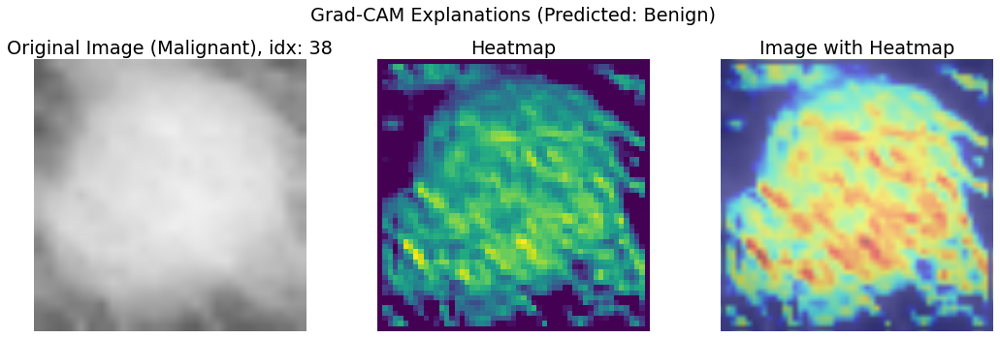

Time to compute Grad-CAM explanations: 0.2022 seconds
1/1 [==============================] - 0s 67ms/step


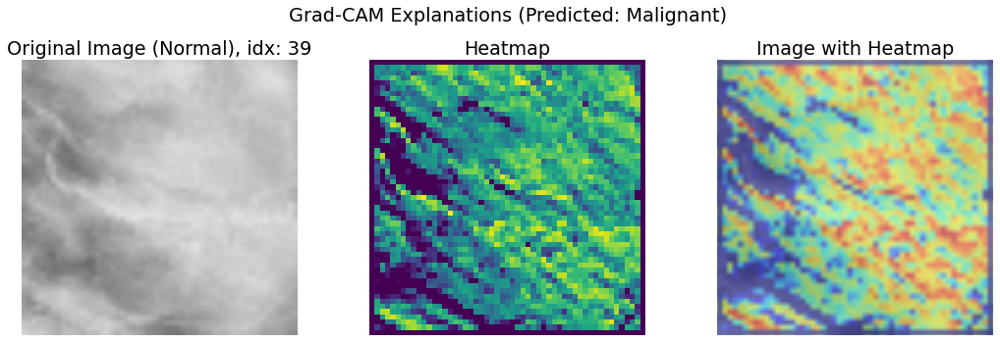

Time to compute Grad-CAM explanations: 0.2172 seconds
1/1 [==============================] - 0s 75ms/step


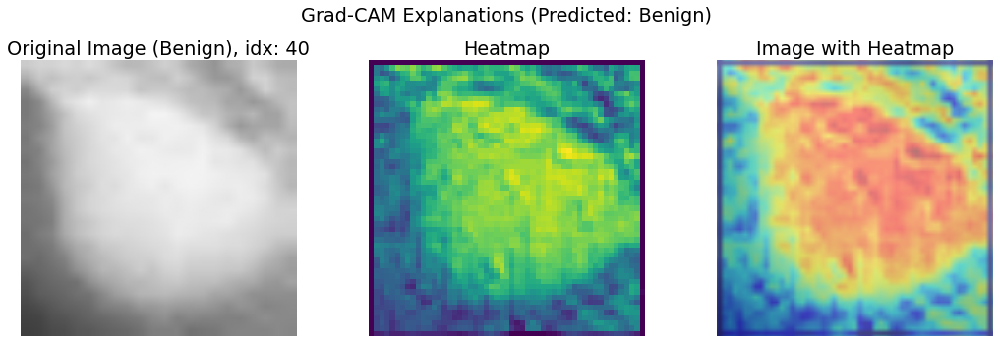

Time to compute Grad-CAM explanations: 0.1932 seconds
1/1 [==============================] - 0s 69ms/step


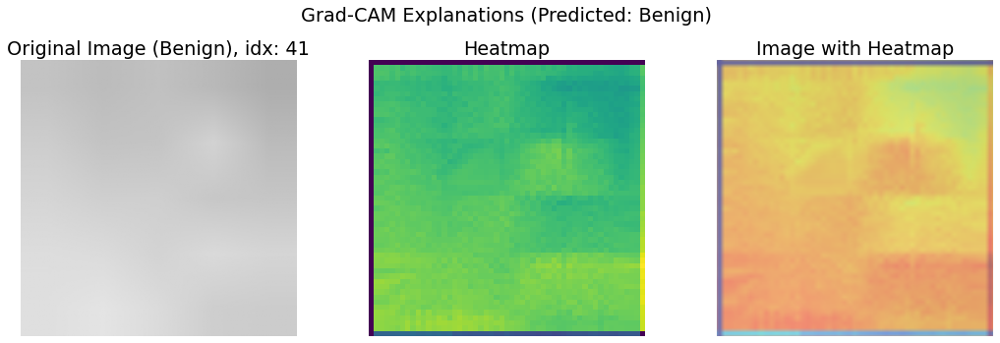

Time to compute Grad-CAM explanations: 0.1899 seconds
1/1 [==============================] - 0s 78ms/step


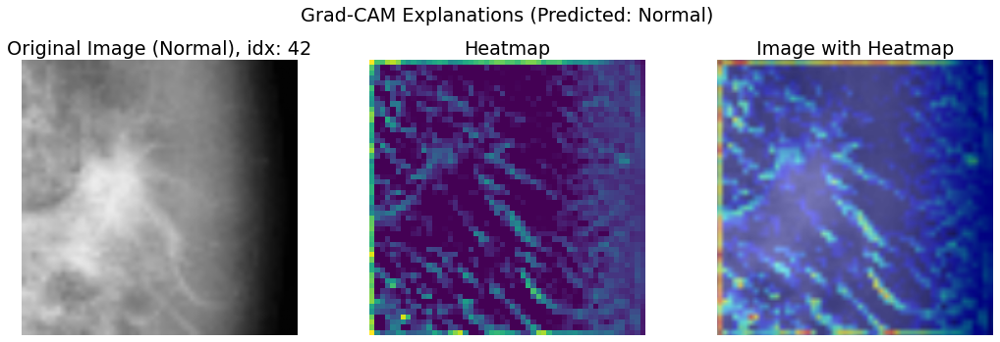

Time to compute Grad-CAM explanations: 0.1912 seconds
1/1 [==============================] - 0s 79ms/step


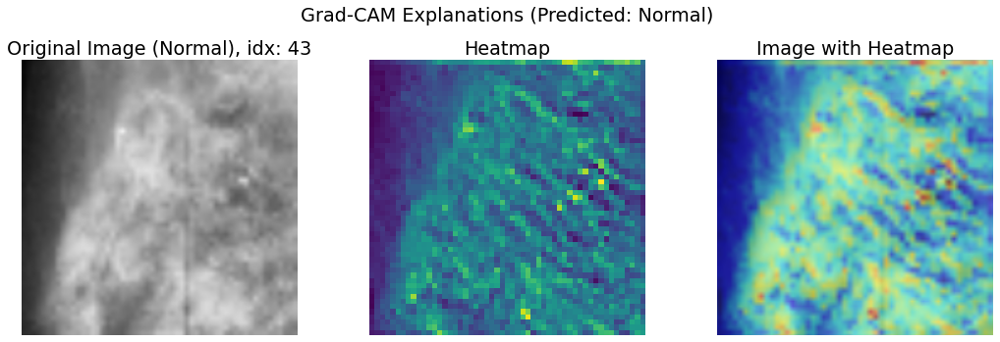

Time to compute Grad-CAM explanations: 0.1892 seconds
1/1 [==============================] - 0s 77ms/step


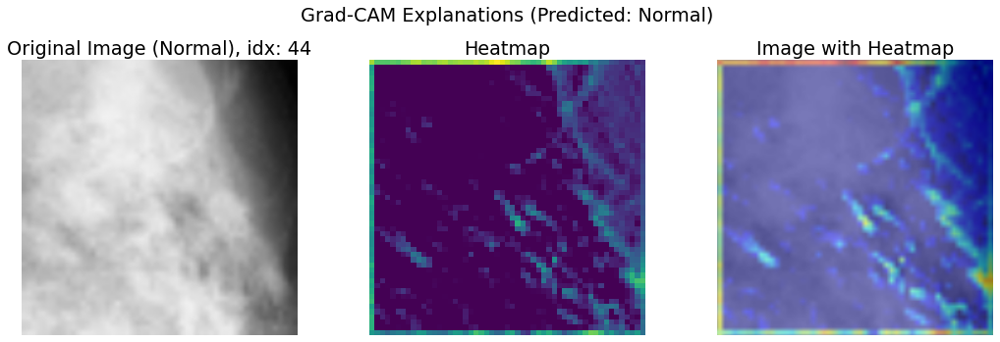

Time to compute Grad-CAM explanations: 0.1909 seconds
1/1 [==============================] - 0s 74ms/step


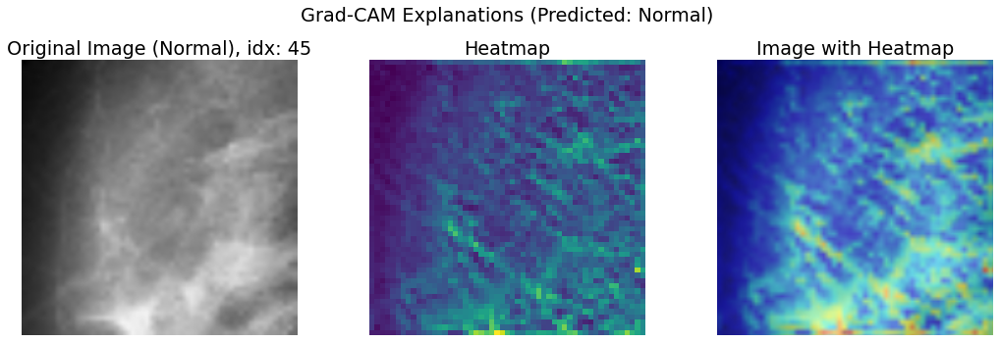

Time to compute Grad-CAM explanations: 0.1936 seconds
1/1 [==============================] - 0s 78ms/step


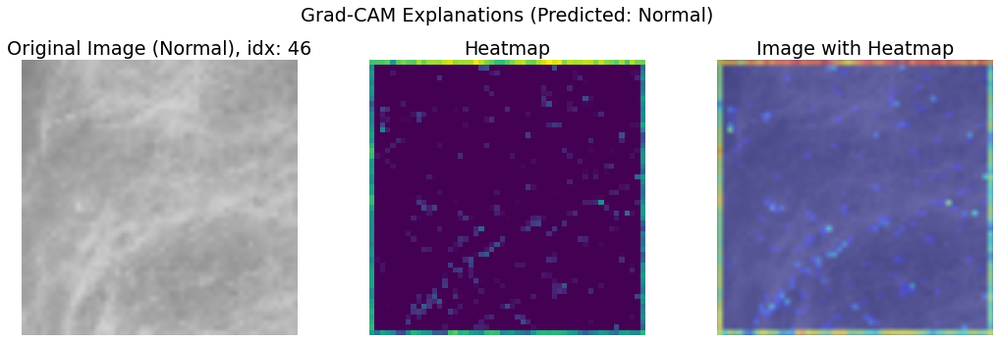

Time to compute Grad-CAM explanations: 0.1904 seconds
1/1 [==============================] - 0s 79ms/step


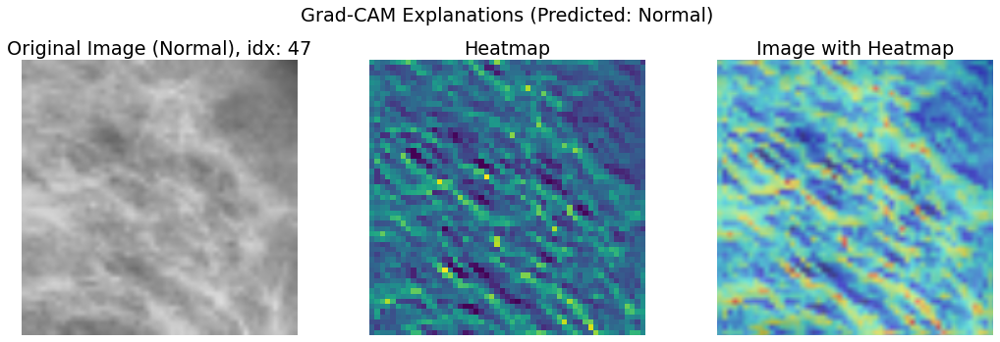

Time to compute Grad-CAM explanations: 0.2110 seconds
3
{0: [(array([[[127, 126, 111],
        [129, 152, 113],
        [130, 159, 114],
        ...,
        [  4,   4, 112],
        [  4,   4, 113],
        [  4,   6, 115]],

       [[153, 133,  83],
        [155, 162,  84],
        [157, 169,  86],
        ...,
        [  4,   4, 110],
        [  4,   4, 110],
        [  4,   4, 112]],

       [[160, 136,  77],
        [162, 165,  79],
        [163, 172,  80],
        ...,
        [  4,   4, 110],
        [  4,   4, 110],
        [  4,   4, 112]],

       ...,

       [[104, 194, 178],
        [113, 202, 169],
        [115, 204, 167],
        ...,
        [ 43, 143, 111],
        [ 45, 142, 108],
        [ 58, 142,  96]],

       [[104, 192, 175],
        [114, 201, 167],
        [116, 203, 165],
        ...,
        [ 43, 143, 111],
        [ 45, 142, 108],
        [ 56, 141,  97]],

       [[108, 182, 165],
        [120, 197, 158],
        [123, 201, 157],
        ...,
        [ 42

In [4]:
## saving all overlaid feature activation maps per class
class_dict = {}
for idx, (img, lab) in enumerate(zip(x_test, y_test)):
    plt.rcParams['font.size'] = 16

    # extracting the true label 
    true = np.argmax(lab)
    # extracting the predicted labrel 
    pred = np.argmax(model.predict(np.array([img])))
    # plot Grad-CAM of the third convolutional layer
    _, _,_, superimposed_img = visualize_gradcam(img, model, "conv2d_2", true_label=true, pred_label=pred, idx = idx)
    if not None in superimposed_img:
        # create a dictionary with {pred_label:(heatmap, true_label)}
        try:
            class_dict[pred].append((superimposed_img,true)) 
        except:
            class_dict[pred] = [(superimposed_img, true)]
            
print(len(class_dict))
print(class_dict)
        

## Plot image grid with GradCAM explanations for each prediction 

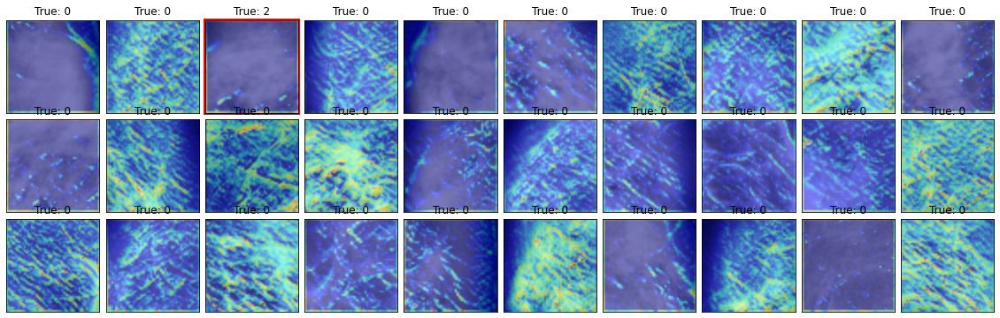

<Figure size 432x288 with 0 Axes>

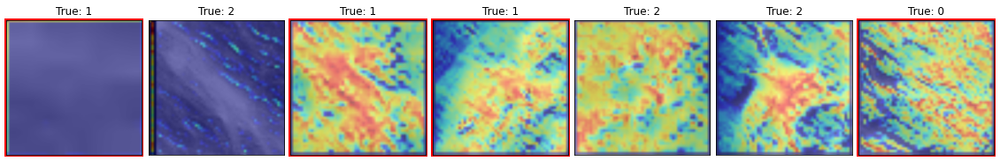

<Figure size 432x288 with 0 Axes>

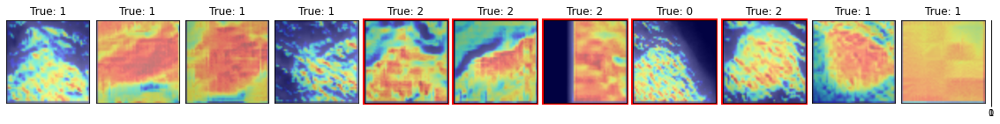

<Figure size 432x288 with 0 Axes>

In [64]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

colrow = [(3,10), (1,7), (1,12)]

for cr, (k, v) in zip(colrow, class_dict.items()): # loop over the predicted labels (k) and plot the images (v[0]) 
    label_names = ["Normal", "Benign", "Malignant"]
    ## v is a list of tuples [(img, lab), (img, lab)] -> list of predicted instances of that class together with their true label 
    true_pred = list(filter(lambda x: x[1] == k, v)) # filter the correct labels 
    false_pred = list(filter(lambda x: x[1] != k, v)) # filter the incorrect cases
    
    fig = plt.figure(figsize=(20., 10.))
    plt.rcParams['font.size'] = 10

    #plt.suptitle('Predicted Class: {}'.format(label_names[k]), fontsize=12,y = -0.1)
    
    # create an imagegrid
    grid = ImageGrid(fig, 111, 
                     nrows_ncols=cr,
                     axes_pad=0.1, 
                     )
    # loop over all images and plot one imagegrid per predicted class
    for i, ((img, lab), is_true) in enumerate(zip(v, [lab==k for (_, lab) in v])):
        ax = grid[i]
        ax.imshow(img)
        ax.set_title('True: {}'.format(lab)) # , y = -0.12, alpha = 0.8
        # mark the incorrect predictions with a red border
        if not is_true:
            #print(is_true)
           # ax.set_frame_on(True)
            ax.patch.set_edgecolor('red')
            ax.patch.set_linewidth(4)
        #ax.axis("off")
        # remove x/y labels and axis
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel('')
        ax.set_ylabel('')

    plt.show()
    plt.savefig(f"gradcamPlots_{label_names[k]}")


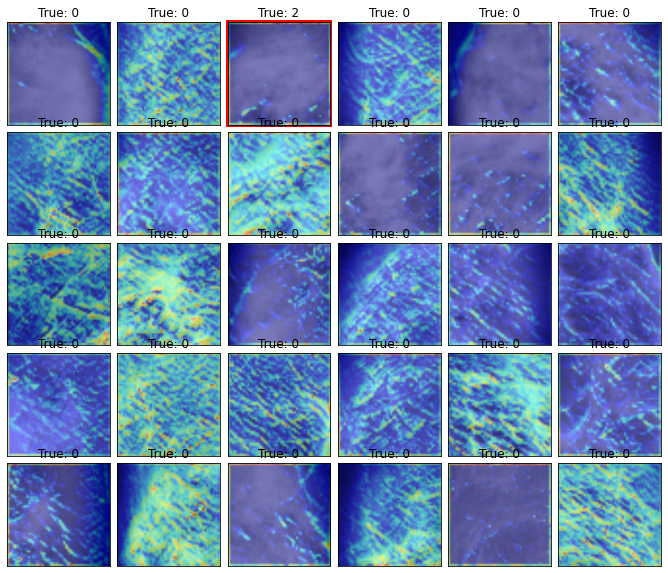

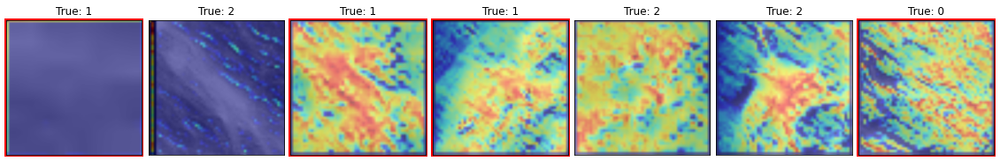

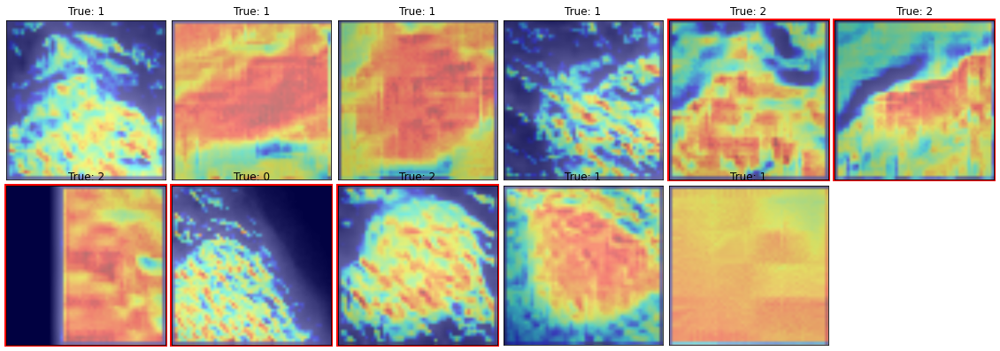

In [34]:
# this is the same with different gridsizes
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

colrow = [(5,6), (1,7), (2,6)]

for i, (k, v) in enumerate(class_dict.items()): # loop over the predicted labels 
    label_names = ["Normal", "Benign", "Malignant"]
    #print(k) # the predicted label 
    #print(len(v)) ## v is a list of tuples [(img, lab), (img, lab)] -> list of predicted instances of that class together with their true label 
    true_pred = list(filter(lambda x: x[1] == k, v)) # filter the correct labels 
    false_pred = list(filter(lambda x: x[1] != k, v)) # filter the incorrect cases
    #print(len(true_pred), len(false_pred))
    
    fig = plt.figure(figsize=(20., 10.))
    plt.rcParams['font.size'] = 10

    #plt.suptitle('Predicted Class: {}'.format(label_names[k]), fontsize=12,y = -0.1)

    if i == 2 and len(v) % 2 == 1: # handle odd number of images in last plot
        cr = (2, (len(v) // 2) + 1)
        grid = ImageGrid(fig, 111, 
                     nrows_ncols=cr,
                     axes_pad=0.1, 
                     )
        grid[-1].set_visible(False) # hide last subplot
    else:
        cr = colrow[i]
        grid = ImageGrid(fig, 111, 
                     nrows_ncols=cr,
                     axes_pad=0.1, 
                     )
        
    for j, ((img, lab), is_true) in enumerate(zip(v, [lab==k for (_, lab) in v])):
        ax = grid[j]
        ax.imshow(img)
        ax.set_title('True: {}'.format(lab)) # , y = -0.12, alpha = 0.8
        if not is_true:
            #print(is_true)
           # ax.set_frame_on(True)
            ax.patch.set_edgecolor('red')
            ax.patch.set_linewidth(4)
        #ax.axis("off")
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel('')
        ax.set_ylabel('')

    plt.show()
    #plt.savefig(f"gradcamPlots_{label_names[k]}")
